# Hometasks №2

In [108]:
#подключение необходимых бибилиотек
import requests
import pandas as pd
from tqdm.auto import tqdm

#### 1)Собрать информацию о всех строящихся объектах на сайте "наш.дом.рф"

Перейдя на сайт наш.дом.рф(https://xn--80az8a.xn--d1aqf.xn--p1ai/%D1%81%D0%B5%D1%80%D0%B2%D0%B8%D1%81%D1%8B/%D0%BA%D0%B0%D1%82%D0%B0%D0%BB%D0%BE%D0%B3-%D0%BD%D0%BE%D0%B2%D0%BE%D1%81%D1%82%D1%80%D0%BE%D0%B5%D0%BA/%D1%81%D0%BF%D0%B8%D1%81%D0%BE%D0%BA-%D0%BE%D0%B1%D1%8A%D0%B5%D0%BA%D1%82%D0%BE%D0%B2/%D0%BA%D0%B0%D1%80%D1%82%D0%B0?objStatus=0&bounds=49.19590614644596%2C38.09633812499997%2C70.71641790939553%2C158.15493187499996) обнаружим, что на данный момент каталог новостроек представлен в количестве 10778 объектов.
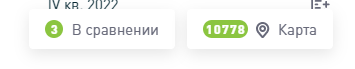

In [9]:
#зададим в цикле количество 10778
offset_ = 0
limit_ = 1000
#формируется список идентификаторов объекта(objId)
sp_id = []
while offset_<10778:
    url = f'https://xn--80az8a.xn--d1aqf.xn--p1ai/%D1%81%D0%B5%D1%80%D0%B2%D0%B8%D1%81%D1%8B/api/kn/object?offset={offset_}&limit={limit_}&sortField=devId.devShortCleanNm&sortType=asc&objStatus=0'
    response = requests.get(url)
    objects_data = response.json()
    objects_list = objects_data.get('data').get('list')
    objids = [x.get('objId') for x in objects_list]
    sp_id+=objids
    offset_+=limit_

In [10]:
#посмотрим на один из объектов и из каких значений он представлен
objects_list[0]

{'hobjId': 36007,
 'objId': 7383,
 'developer': {'devId': 1253,
  'shortName': 'СП ИНИЦИАТИВА ОАО КПД',
  'fullName': 'СТРОИТЕЛЬНОЕ ПРЕДПРИЯТИЕ ИНИЦИАТИВА ОАО КРУПНОПАНЕЛЬНОЕ ДОМОСТРОЕНИЕ',
  'groupName': 'Крупнопанельное Домостроение',
  'orgForm': {'id': 4,
   'fullForm': 'Общество с ограниченной ответственностью',
   'shortForm': 'ООО'},
  'companyGroup': 7270,
  'devInn': '0276045224'},
 'rpdRegionCd': 2,
 'objAddr': 'г Уфа, район Советский, улица Владивостоккая, д. 4, литера 16, блок-секция "Г","Д"',
 'objCommercNm': 'ЖК "Мередиан"',
 'objFloorMin': 2,
 'objFloorMax': 24,
 'objElemLivingCnt': 196,
 'objReady100PercDt': '2025-06-30',
 'objSquareLiving': 11861.15,
 'objCompensFundFlg': 1,
 'objProblemFlg': 0,
 'latitude': 54.7317,
 'longitude': 55.9923,
 'problemFlag': 'NONE',
 'siteStatus': 'Строящиеся',
 'objGuarantyEscrowFlg': 0,
 'residentialBuildings': 1,
 'rpdNum': '02-000318',
 'pdId': 14270,
 'buildType': 'Жилое',
 'objStatus': 0}

In [11]:
#количество идентификаторов объектов
#видим, что он совпадает с количеством объектов на сайте, значит извлечение данных прошло успешно
len(sp_id)

10767

#### 2)Cохранить ее в pandas dataframe

In [12]:
# Для скачивания данных по определенному объекту, нужно добавить его идентификатор(id) в конец строки запроса
#сформируем список, содержащий все данные по определенному объекту(ниже идет загрузка данных по 50 объектам) 
spis = []
for id in tqdm(sp_id):
    url = f'https://xn--80az8a.xn--d1aqf.xn--p1ai/%D1%81%D0%B5%D1%80%D0%B2%D0%B8%D1%81%D1%8B/api/object/{id}'
    res = requests.get(url)
    it = res.json()
    spis.append(it)
#для скачивания всех данных для всех объектов(выполняется продолжительное время)
#for id in tqdm(sp_id):
#    url = f'https://xn--80az8a.xn--d1aqf.xn--p1ai/%D1%81%D0%B5%D1%80%D0%B2%D0%B8%D1%81%D1%8B/api/object/{id}'
#    res = requests.get(url)
#    it = res.json()
#    spis.append(it)    
    
    
df = pd.json_normalize(spis)


  0%|          | 0/10767 [00:00<?, ?it/s]

In [13]:
#посмотрим, что из себя представляют данные по объектам
df.head(5)


,errcode,data.id,data.hobjId,data.pdId,data.developer.devId,data.developer.devShortCleanNm,data.developer.devShortNm,data.developer.devFullCleanNm,data.developer.problObjCnt,data.developer.buildObjCnt,...,data.transportDistIndexValue,data.developer.bankruptStage.bankruptStageCd,data.developer.bankruptStage.bankruptStageDesc,data.developer.bankruptStage.bankruptLawUrl,data.developer.orgBankruptMsgDttm,data.airQualityIndexValue,data.complexShortNm,data.greenAreaIndexValue,data.rnvFlg,data.rnvDTO
0,0,13391,37219,28101,306,2МЕН ГРУПП,2МЕН ГРУПП,2МЕН ГРУПП,0,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,13383,39024,28105,306,2МЕН ГРУПП,2МЕН ГРУПП,2МЕН ГРУПП,0,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,13398,37165,28141,306,2МЕН ГРУПП,2МЕН ГРУПП,2МЕН ГРУПП,0,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,13397,37201,28141,306,2МЕН ГРУПП,2МЕН ГРУПП,2МЕН ГРУПП,0,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,13399,34754,28141,306,2МЕН ГРУПП,2МЕН ГРУПП,2МЕН ГРУПП,0,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
df.to_excel("DF_Finish.xlsx")

In [15]:
df.to_pickle("./df_Finish.pkl")

In [109]:
#открытие файла 
df = pd.read_excel('DF_Finish.xlsx',index_col=0) 

In [110]:
df

,errcode,data.id,data.hobjId,data.pdId,data.developer.devId,data.developer.devShortCleanNm,data.developer.devShortNm,data.developer.devFullCleanNm,data.developer.problObjCnt,data.developer.buildObjCnt,data.developer.comissObjCnt,data.developer.regRegionDesc,data.developer.devPhoneNum,data.developer.devSite,data.developer.devEmail,data.developer.devInn,data.developer.devOgrn,data.developer.devKpp,data.developer.devLegalAddr,data.developer.devFactAddr,data.developer.lastRpdId,data.developer.fundGuarantyFlg,data.developer.devOrgRegRegionCd,data.developer.devEmplMainFullNm,data.developer.developerGroupName,data.developer.orgForm.id,data.developer.orgForm.fullForm,data.developer.orgForm.shortForm,data.developer.companyGroupId,data.developer.objGuarantyEscrowFlg,data.developer.govFundFlg,data.region,data.address,data.floorMin,data.floorMax,data.objElemLivingCnt,data.objReady100PercDt,data.wallMaterialShortDesc,data.objLkFinishTypeDesc,data.objLkFreePlanDesc,data.objElemParkingCnt,data.objSquareLiving,data.rpdNum,data.rpdPdfLink,data.rpdIssueDttm,data.objLkLatitude,data.objLkLongitude,data.objCompensFundFlg,data.objProblemFlg,data.objLkClassDesc,data.loadDttm,data.photoRenderDTO,data.objGuarantyEscrowFlg,data.objectType,data.miniUrl,data.residentialBuildings,data.newBuildingId,data.objFloorCnt,data.objFlatCnt,data.objFlatSq,data.objNonlivElemCnt,data.quartography.objLivElem1KCnt,data.quartography.objLivElem2KCnt,data.quartography.objLivElem3KCnt,data.quartography.objLivElem4KCnt,data.quartography.objLivElemCnt,data.quartography.objLivElemEntrCnt,data.quartography.objLivElemEntrFloorAvg,data.objStatus,data.isAvailableWantLiveHere,data.objTransferPlanDt,data.objLivCeilingHeight,data.objInfrstrBicycleLaneFlg,data.objInfrstrPlaygrndCnt,data.objInfrstrSportGroundCnt,data.objInfrstrTrashAreaCnt,data.objInfrstrObjPrkngCnt,data.objInfrstrNotObjPrkngCnt,data.objInfrstrRampFlg,data.objInfrstrCurbLoweringFlg,data.objElevatorWheelchairCnt,data.objElevatorPassengerCnt,data.objElevatorCargoCnt,data.objElevatorCargoPassengerCnt,data.soldOutPerc,data.objPriceAvg,data.generalContractorNm,data.nonlivFirstFloor,data.objectTransportInfo,data.conclusion,data.objLkSaleDepEmail,data.objGreenHouseFlg,data.objEnergyEffShortDesc,data.infrastructureIndexValue,data.nameObj,data.metro.id,data.metro.name,data.metro.line,data.metro.color,data.metro.time,data.metro.isWalk,data.metro.colors,data.transportDistIndex,data.transportDistIndexValue,data.developer.bankruptStage.bankruptStageCd,data.developer.bankruptStage.bankruptStageDesc,data.developer.bankruptStage.bankruptLawUrl,data.developer.orgBankruptMsgDttm,data.airQualityIndexValue,data.complexShortNm,data.greenAreaIndexValue,data.rnvFlg,data.rnvDTO
0,0,13391,37219,28101,306,2МЕН ГРУПП,2МЕН ГРУПП,2МЕН ГРУПП,0,5,0,Тюменская область,+7(345)279-18-88,2mengroup.ru,info@2mengroup.ru,7701651356,1067746424899,720301001,"Тюменская область, город Тюмень, улица Комсомо...","Тюменская область, город Тюмень, улица Комсомо...",667500.0,1,72.0,Киселев Сергей Михайлович,2МЕН ГРУПП ДЕВЕЛОПМЕНТ,1,Акционерное общество,АО,5776.0,0,0,72,"г Тюмень, ул Профсоюзная",3,12,44,2022-12-31,Другое,По желанию заказчика,Есть,41,4297.44,72-000096,https://xn--80az8a.xn--d1aqf.xn--p1ai/api/ext/...,09-12-2022 15:04,57.1541,65.5595,1,0,Элитный,15-12-2022 01:22,"[{'objId': 13391, 'pdId': 28101, 'rpdId': 6674...",0,normal,https://xn--80az8a.xn--d1aqf.xn--p1ai/api/ext/...,1,37219.0,12,44,4297.44,26,11.0,16.0,12.0,5.0,44.0,2.0,4.0,0,True,28-02-2023 12:00,"2,8",0,1.0,1.0,1.0,0.0,9.0,1,1,0.0,2.0,2.0,6,0.450622,55893.0,ООО Транспромжилстрой-2005 (ИНН: 7204097730),1.0,[],0.0,info@2mengroup.ru,0,B,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,13383,39024,28105,306,2МЕН ГРУПП,2МЕН ГРУПП,2МЕН ГРУПП,0,5,0,Тюменская область,+7(345)279-18-88,2mengroup.ru,info@2mengroup.ru,7701651356,1067746424899,720301001,"Тюменская область, город Тюмень, улица Комсомо...","Тюменская область, город Тюмень, улица Комсомо...",667500.0,1,72.0,

In [111]:
#отобразим все колонки DataFrame
pd.set_option('display.max_columns', None)
df.head()

,errcode,data.id,data.hobjId,data.pdId,data.developer.devId,data.developer.devShortCleanNm,data.developer.devShortNm,data.developer.devFullCleanNm,data.developer.problObjCnt,data.developer.buildObjCnt,data.developer.comissObjCnt,data.developer.regRegionDesc,data.developer.devPhoneNum,data.developer.devSite,data.developer.devEmail,data.developer.devInn,data.developer.devOgrn,data.developer.devKpp,data.developer.devLegalAddr,data.developer.devFactAddr,data.developer.lastRpdId,data.developer.fundGuarantyFlg,data.developer.devOrgRegRegionCd,data.developer.devEmplMainFullNm,data.developer.developerGroupName,data.developer.orgForm.id,data.developer.orgForm.fullForm,data.developer.orgForm.shortForm,data.developer.companyGroupId,data.developer.objGuarantyEscrowFlg,data.developer.govFundFlg,data.region,data.address,data.floorMin,data.floorMax,data.objElemLivingCnt,data.objReady100PercDt,data.wallMaterialShortDesc,data.objLkFinishTypeDesc,data.objLkFreePlanDesc,data.objElemParkingCnt,data.objSquareLiving,data.rpdNum,data.rpdPdfLink,data.rpdIssueDttm,data.objLkLatitude,data.objLkLongitude,data.objCompensFundFlg,data.objProblemFlg,data.objLkClassDesc,data.loadDttm,data.photoRenderDTO,data.objGuarantyEscrowFlg,data.objectType,data.miniUrl,data.residentialBuildings,data.newBuildingId,data.objFloorCnt,data.objFlatCnt,data.objFlatSq,data.objNonlivElemCnt,data.quartography.objLivElem1KCnt,data.quartography.objLivElem2KCnt,data.quartography.objLivElem3KCnt,data.quartography.objLivElem4KCnt,data.quartography.objLivElemCnt,data.quartography.objLivElemEntrCnt,data.quartography.objLivElemEntrFloorAvg,data.objStatus,data.isAvailableWantLiveHere,data.objTransferPlanDt,data.objLivCeilingHeight,data.objInfrstrBicycleLaneFlg,data.objInfrstrPlaygrndCnt,data.objInfrstrSportGroundCnt,data.objInfrstrTrashAreaCnt,data.objInfrstrObjPrkngCnt,data.objInfrstrNotObjPrkngCnt,data.objInfrstrRampFlg,data.objInfrstrCurbLoweringFlg,data.objElevatorWheelchairCnt,data.objElevatorPassengerCnt,data.objElevatorCargoCnt,data.objElevatorCargoPassengerCnt,data.soldOutPerc,data.objPriceAvg,data.generalContractorNm,data.nonlivFirstFloor,data.objectTransportInfo,data.conclusion,data.objLkSaleDepEmail,data.objGreenHouseFlg,data.objEnergyEffShortDesc,data.infrastructureIndexValue,data.nameObj,data.metro.id,data.metro.name,data.metro.line,data.metro.color,data.metro.time,data.metro.isWalk,data.metro.colors,data.transportDistIndex,data.transportDistIndexValue,data.developer.bankruptStage.bankruptStageCd,data.developer.bankruptStage.bankruptStageDesc,data.developer.bankruptStage.bankruptLawUrl,data.developer.orgBankruptMsgDttm,data.airQualityIndexValue,data.complexShortNm,data.greenAreaIndexValue,data.rnvFlg,data.rnvDTO
0,0,13391,37219,28101,306,2МЕН ГРУПП,2МЕН ГРУПП,2МЕН ГРУПП,0,5,0,Тюменская область,+7(345)279-18-88,2mengroup.ru,info@2mengroup.ru,7701651356,1067746424899,720301001,"Тюменская область, город Тюмень, улица Комсомо...","Тюменская область, город Тюмень, улица Комсомо...",667500.0,1,72.0,Киселев Сергей Михайлович,2МЕН ГРУПП ДЕВЕЛОПМЕНТ,1,Акционерное общество,АО,5776.0,0,0,72,"г Тюмень, ул Профсоюзная",3,12,44,2022-12-31,Другое,По желанию заказчика,Есть,41,4297.44,72-000096,https://xn--80az8a.xn--d1aqf.xn--p1ai/api/ext/...,09-12-2022 15:04,57.1541,65.5595,1,0,Элитный,15-12-2022 01:22,"[{'objId': 13391, 'pdId': 28101, 'rpdId': 6674...",0,normal,https://xn--80az8a.xn--d1aqf.xn--p1ai/api/ext/...,1,37219.0,12,44,4297.44,26,11.0,16.0,12.0,5.0,44.0,2.0,4.0,0,True,28-02-2023 12:00,"2,8",0,1.0,1.0,1.0,0.0,9.0,1,1,0.0,2.0,2.0,6,0.450622,55893.0,ООО Транспромжилстрой-2005 (ИНН: 7204097730),1.0,[],0.0,info@2mengroup.ru,0,B,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,13383,39024,28105,306,2МЕН ГРУПП,2МЕН ГРУПП,2МЕН ГРУПП,0,5,0,Тюменская область,+7(345)279-18-88,2mengroup.ru,info@2mengroup.ru,7701651356,1067746424899,720301001,"Тюменская область, город Тюмень, улица Комсомо...","Тюменская область, город Тюмень, улица Комсомо...",667500.0,1,72.0,

In [ ]:
#наиболее интересные колонки в DF
#data.id - ID дома
#data.developer.devFullCleanNm - имя застройщика
#data.developer.regRegionDesc - регион, в которм строится объект в прописном виде
#data.developer.developerGroupName - группа компаний застройщика
#data.region - регион, в котором строится объект(число)
#data.floorMax - число этажей в доме
#data.objElemLivingCnt - количество квартир в доме
#data.objReady100PercDt - дата ввода в эксплкатацию дома
#data.objLkFinishTypeDesc - тип отделки в квартире
#data.objLkFreePlanDesc - свободная планировка(да, нет)
#data.objElemParkingCnt - Количество мест в паркинге
#data.objSquareLiving - Жилая площадь, м²
#data.objLkClassDesc -Класс недвижимости
#data.soldOutPerc - процент распроданных квартир(формат 0.450622)
#data.objPriceAvg - Средняя цена за 1 м²

In [112]:
#создание своего модифицированного DF
modif_df = df[['data.id','data.developer.devFullCleanNm','data.developer.regRegionDesc','data.developer.developerGroupName',
             'data.region','data.floorMax','data.objElemLivingCnt','data.objReady100PercDt','data.objLkFinishTypeDesc',
              'data.objLkFreePlanDesc','data.objElemParkingCnt','data.objSquareLiving','data.objLkClassDesc','data.soldOutPerc',
              'data.objPriceAvg']].set_index('data.id')

In [113]:
#переименование колонок в DF
modif_df.columns =['Имя_застройщика','Город','Имя_ГК','Регион','Кол-во_этажей','Кол-во_квартир','Дата_ввода','Тип_отделки','Free_планировка',
                  'Мест_в_паркинге','Жилая_площадь','Класс_недвижимости','%_продажи','Средняя_цена_м']

In [114]:
#процент продаж в обычной форме
modif_df['%_продажи'] = modif_df['%_продажи']*100

In [115]:
#переименование столбца индексов
modif_df.index.names = ['id']
modif_df

,Имя_застройщика,Город,Имя_ГК,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,%_продажи,Средняя_цена_м
id,,,,,,,,,,,,,,
13391,2МЕН ГРУПП,Тюменская область,2МЕН ГРУПП ДЕВЕЛОПМЕНТ,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,45.062177,55893.0
13383,2МЕН ГРУПП,Тюменская область,2МЕН ГРУПП ДЕВЕЛОПМЕНТ,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,40.698478,53109.0
13398,2МЕН ГРУПП,Тюменская область,2МЕН ГРУПП ДЕВЕЛОПМЕНТ,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,100.000000,47886.0
13397,2МЕН ГРУПП,Тюменская область,2МЕН ГРУПП ДЕВЕЛОПМЕНТ,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,99.998400,45523.0
13399,2МЕН ГРУПП,Тюменская область,2МЕН ГРУПП ДЕВЕЛОПМЕНТ,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,91.724287,50768.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28071,ЯРКИЙ МИР,Московская область,ПИК,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,7.115478,85604.0
28070,ЯРКИЙ МИР,Московская область,ПИК,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,7.288294,85309.0
28073,ЯРКИЙ МИР,Московская область,ПИК,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,7.083401,85634.0


In [116]:
#узнаем информацию о DF
#видим, что в некоторых колонках присутствуют неопределенные(Null) значения
modif_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10767 entries, 13391 to 45321
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Имя_застройщика     10767 non-null  object 
 1   Город               10659 non-null  object 
 2   Имя_ГК              7713 non-null   object 
 3   Регион              10767 non-null  int64  
 4   Кол-во_этажей       10767 non-null  int64  
 5   Кол-во_квартир      10767 non-null  int64  
 6   Дата_ввода          10767 non-null  object 
 7   Тип_отделки         10767 non-null  object 
 8   Free_планировка     10756 non-null  object 
 9   Мест_в_паркинге     10767 non-null  int64  
 10  Жилая_площадь       10767 non-null  float64
 11  Класс_недвижимости  10767 non-null  object 
 12  %_продажи           7579 non-null   float64
 13  Средняя_цена_м      7573 non-null   float64
dtypes: float64(3), int64(4), object(7)
memory usage: 1.2+ MB


In [117]:
#определим, сколько таких значений в каждой колонке
modif_df.isnull().sum()

Имя_застройщика          0
Город                  108
Имя_ГК                3054
Регион                   0
Кол-во_этажей            0
Кол-во_квартир           0
Дата_ввода               0
Тип_отделки              0
Free_планировка         11
Мест_в_паркинге          0
Жилая_площадь            0
Класс_недвижимости       0
%_продажи             3188
Средняя_цена_м        3194
dtype: int64

In [118]:
#много пропущенных значений в столбце Имя_ГК (группа компаний застройщика)
#удалим ее из DF, так как большого значения в дальнейшем анализе она не сыграет
modif_df = modif_df.drop('Имя_ГК', axis=1)

In [119]:
modif_df

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,%_продажи,Средняя_цена_м
id,,,,,,,,,,,,,
13391,2МЕН ГРУПП,Тюменская область,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,45.062177,55893.0
13383,2МЕН ГРУПП,Тюменская область,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,40.698478,53109.0
13398,2МЕН ГРУПП,Тюменская область,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,100.000000,47886.0
13397,2МЕН ГРУПП,Тюменская область,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,99.998400,45523.0
13399,2МЕН ГРУПП,Тюменская область,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,91.724287,50768.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
28071,ЯРКИЙ МИР,Московская область,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,7.115478,85604.0
28070,ЯРКИЙ МИР,Московская область,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,7.288294,85309.0
28073,ЯРКИЙ МИР,Московская область,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,7.083401,85634.0


In [120]:
modif_df.isnull().sum()

Имя_застройщика          0
Город                  108
Регион                   0
Кол-во_этажей            0
Кол-во_квартир           0
Дата_ввода               0
Тип_отделки              0
Free_планировка         11
Мест_в_паркинге          0
Жилая_площадь            0
Класс_недвижимости       0
%_продажи             3188
Средняя_цена_м        3194
dtype: int64

In [121]:
#посмотрим на строки, в которых отсутсвует значение в столбце Город
modif_df_null_city = modif_df[modif_df['Город'].isnull()]
modif_df_null_city

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,%_продажи,Средняя_цена_м
id,,,,,,,,,,,,,
30008,БРИЗ,NaN,50,17,288,2023-03-31,Без отделки,Есть,0,11206.40,Комфорт,89.104440,68765.0
42354,ДОРСТРОЙИНДУСТРИЯ,NaN,64,1,4,2021-12-31,Под ключ,Нет,0,132.00,Типовой,NaN,NaN
27145,ЖИЛСТРОЙМОНТАЖ,NaN,27,3,60,2023-03-31,Другое,Нет,0,2868.40,Комфорт,97.671176,67451.0
42594,ЖК НА ТЕАТРАЛЬНОЙ-3,NaN,64,11,144,2023-12-31,Без отделки,Нет,40,10298.25,Комфорт,57.062316,59431.0
42636,КАНТ СПЕЦИАЛИЗИРОВАННЫЙ ЗАСТРОЙЩИК,NaN,18,11,96,2024-09-30,Под чистовую,Нет,0,5411.70,Комфорт,23.090711,74811.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
41936,ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮСТРОИТ...,NaN,9,8,56,2023-06-30,Другое,NaN,0,3596.90,Другое,NaN,NaN
45104,СТРОЙИНВЕСТПРОЕКТ,NaN,76,6,100,2022-12-31,Под чистовую,Есть,0,5375.60,Комфорт,NaN,NaN
44145,ТЕРМИНАЛ-ХОЛДИНГ,NaN,63,8,56,2023-09-30,Под чистовую,Нет,0,3745.47,Комфорт,27.510299,76772.0


In [122]:
modif_df_null_city['Регион'].unique()

array([50, 64, 27, 18, 77, 39, 54, 76, 25, 78, 24, 86, 38, 29,  2, 63, 36,
       28, 13, 61, 74, 16, 59, 14, 52, 56, 57,  9], dtype=int64)

In [123]:
#создадим словарь регионов, для подстановки вместо NaN значений 
dict_reg = {50:'Московская область', 64:'Саратовская область', 27:'Хабаровский край', 18:'Удмуртская Республика',77:'г.Москва',
           39:'Калининградская область',54:'Новосибирская область',76:'Ярославская область',25:'Приморский край',78:'г.Санкт-Петербург',
           24:'Красноярский край',86:'Ханты-Мансийский автономный округ - Югра',38:'Иркутская область', 29:'Архангельская область',
           2:'Республика Башкортостан',63:'Самарская область',36:'Воронежская область',28:'Амурская область',13:'Республика Мордовия',
           61:'Ростовская область',74:'Челябинская область',16:'Республика Татарстан (Татарстан)',59:'Пермская область',14:'Республика Саха (Якутия)',
           52:'Нижегородская область',56:'Оренбургская область',57:'Орловская область',9:'Карачаево-Черкесская Республика'}

In [124]:
#маска
mask = modif_df_null_city['Город'].astype('str').isin(['NaN','nan'])

In [125]:
#замена
modif_df_null_city.loc[mask, 'Город'] = modif_df_null_city.loc[mask, 'Регион'].map(dict_reg)

C:\Users\Tsvet\AppData\Local\Temp\ipykernel_4696\3411504534.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  modif_df_null_city.loc[mask, 'Город'] = modif_df_null_city.loc[mask, 'Регион'].map(dict_reg)


In [126]:
modif_df_null_city

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,%_продажи,Средняя_цена_м
id,,,,,,,,,,,,,
30008,БРИЗ,Московская область,50,17,288,2023-03-31,Без отделки,Есть,0,11206.40,Комфорт,89.104440,68765.0
42354,ДОРСТРОЙИНДУСТРИЯ,Саратовская область,64,1,4,2021-12-31,Под ключ,Нет,0,132.00,Типовой,NaN,NaN
27145,ЖИЛСТРОЙМОНТАЖ,Хабаровский край,27,3,60,2023-03-31,Другое,Нет,0,2868.40,Комфорт,97.671176,67451.0
42594,ЖК НА ТЕАТРАЛЬНОЙ-3,Саратовская область,64,11,144,2023-12-31,Без отделки,Нет,40,10298.25,Комфорт,57.062316,59431.0
42636,КАНТ СПЕЦИАЛИЗИРОВАННЫЙ ЗАСТРОЙЩИК,Удмуртская Республика,18,11,96,2024-09-30,Под чистовую,Нет,0,5411.70,Комфорт,23.090711,74811.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
41936,ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮСТРОИТ...,Карачаево-Черкесская Республика,9,8,56,2023-06-30,Другое,NaN,0,3596.90,Другое,NaN,NaN
45104,СТРОЙИНВЕСТПРОЕКТ,Ярославская область,76,6,100,2022-12-31,Под чистовую,Есть,0,5375.60,Комфорт,NaN,NaN
44145,ТЕРМИНАЛ-ХОЛДИНГ,Самарская область,63,8,56,2023-09-30,Под чистовую,Нет,0,3745.47,Комфорт,27.510299,76772.0


In [128]:
#сольем DF измененный с исходным и посомтрим на пропущенные значения
modif_df.loc[modif_df_null_city.index] = modif_df_null_city
modif_df

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,%_продажи,Средняя_цена_м
id,,,,,,,,,,,,,
13391,2МЕН ГРУПП,Тюменская область,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,45.062177,55893.0
13383,2МЕН ГРУПП,Тюменская область,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,40.698478,53109.0
13398,2МЕН ГРУПП,Тюменская область,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,100.000000,47886.0
13397,2МЕН ГРУПП,Тюменская область,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,99.998400,45523.0
13399,2МЕН ГРУПП,Тюменская область,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,91.724287,50768.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
28071,ЯРКИЙ МИР,Московская область,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,7.115478,85604.0
28070,ЯРКИЙ МИР,Московская область,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,7.288294,85309.0
28073,ЯРКИЙ МИР,Московская область,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,7.083401,85634.0


In [129]:
modif_df.isnull().sum()

Имя_застройщика          0
Город                    0
Регион                   0
Кол-во_этажей            0
Кол-во_квартир           0
Дата_ввода               0
Тип_отделки              0
Free_планировка         11
Мест_в_паркинге          0
Жилая_площадь            0
Класс_недвижимости       0
%_продажи             3188
Средняя_цена_м        3194
dtype: int64

In [130]:
#посмотрим на строки, в которых отсутсвует значение в столбце Free_планировка
modif_df_null_plan = modif_df[modif_df['Free_планировка'].isnull()]
modif_df_null_plan

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,%_продажи,Средняя_цена_м
id,,,,,,,,,,,,,
8809,АБСОЛЮТ,Челябинская область,74,10,129,2019-03-31,Под ключ,NaN,0,5766.30,Другое,NaN,NaN
8810,АБСОЛЮТ,Челябинская область,74,10,119,2019-03-31,Под ключ,NaN,0,3927.28,Другое,NaN,NaN
49526,УНИТАРНАЯ НЕКОММЕРЧЕСКАЯ ОРГАНИЗАЦИЯ РОСТОВСКИ...,Ростовская область,61,10,72,2023-09-30,Другое,NaN,23,2713.60,Другое,NaN,NaN
13194,НОРМАНН ЛО,Ленинградская область,47,18,884,2018-12-31,Другое,NaN,0,30435.55,Другое,NaN,NaN
13450,НОРМАНН-ЗАПАД,Санкт-Петербург город,47,12,982,2020-12-31,Другое,NaN,0,29051.20,Другое,NaN,NaN
45585,ПРАКТИК,Ярославская область,76,3,36,2022-06-30,Другое,NaN,0,1652.67,Другое,NaN,NaN
48508,СПЕЦИАЛИЗИРОВАННЫЙ ЗАСТРОЙЩИК КАПИТАЛ,Краснодарский край,23,13,0,2027-09-30,Другое,NaN,336,0.00,Другое,NaN,NaN
46569,СПЕЦИАЛИЗИРОВАННЫЙ ЗАСТРОЙЩИК ФАКЕЛ-К,Владимирская область,33,4,48,2022-12-31,Другое,NaN,0,1819.18,Другое,NaN,NaN
29792,СПЕЦИАЛИЗИРОВАННЫЙ ЗАСТРОЙЩИК ЭСТЕЙТ ИНВЕСТМЕНТС,Московская область,50,3,33,2020-03-31,Другое,NaN,0,1976.70,Другое,NaN,NaN


In [142]:
#посмотрим,какие значения в DF встречаются чаще всего


In [131]:
modif_df['Free_планировка'].value_counts()

Нет     8665
Есть    2091
Name: Free_планировка, dtype: int64

In [132]:
#видно, что в основном в большинстве объектов нет свободной планировки, поэтому пропущенные значения заменим 
#наиболее встречающимся значением
modif_df_null_plan.fillna('Нет',inplace=True)

C:\Users\Tsvet\AppData\Local\Temp\ipykernel_4696\1607874054.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  modif_df_null_plan.fillna('Нет',inplace=True)


In [133]:
modif_df.loc[modif_df_null_plan.index] = modif_df_null_plan
modif_df

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,%_продажи,Средняя_цена_м
id,,,,,,,,,,,,,
13391,2МЕН ГРУПП,Тюменская область,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,45.062177,55893.0
13383,2МЕН ГРУПП,Тюменская область,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,40.698478,53109.0
13398,2МЕН ГРУПП,Тюменская область,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,100.0,47886.0
13397,2МЕН ГРУПП,Тюменская область,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,99.9984,45523.0
13399,2МЕН ГРУПП,Тюменская область,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,91.724287,50768.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
28071,ЯРКИЙ МИР,Московская область,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,7.115478,85604.0
28070,ЯРКИЙ МИР,Московская область,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,7.288294,85309.0
28073,ЯРКИЙ МИР,Московская область,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,7.083401,85634.0


In [134]:
#Остались пустые значения в столбцах %_продажи и Средняя_цена_м
modif_df.isnull().sum()

Имя_застройщика          0
Город                    0
Регион                   0
Кол-во_этажей            0
Кол-во_квартир           0
Дата_ввода               0
Тип_отделки              0
Free_планировка          0
Мест_в_паркинге          0
Жилая_площадь            0
Класс_недвижимости       0
%_продажи             3177
Средняя_цена_м        3183
dtype: int64

In [135]:
modif_df_null_pr = modif_df[modif_df['%_продажи'].isnull()]
modif_df_null_pr

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,%_продажи,Средняя_цена_м
id,,,,,,,,,,,,,
49294,АВТОПРЕМИУМ,Костромская область,44,3,32,2023-12-31,Без отделки,Нет,0,1407.80,Типовой,NaN,NaN
49503,АВТОФОРСАЖ,Костромская область,44,5,48,2024-06-30,Без отделки,Нет,0,2448.00,Типовой,NaN,NaN
27802,ТЕХНОПАРК НОВОСИБИРСКОГО АКАДЕМГОРОДКА,Новосибирская область,54,3,12,2024-03-31,Без отделки,Есть,0,889.20,Типовой,NaN,NaN
27798,ТЕХНОПАРК НОВОСИБИРСКОГО АКАДЕМГОРОДКА,Новосибирская область,54,3,12,2024-03-31,Без отделки,Есть,0,889.20,Типовой,NaN,NaN
27801,ТЕХНОПАРК НОВОСИБИРСКОГО АКАДЕМГОРОДКА,Новосибирская область,54,3,12,2024-03-31,Без отделки,Есть,0,889.20,Типовой,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
49054,ЮГ-ТЕПЛОСЕРВИС,Краснодарский край,23,10,160,2024-06-30,Без отделки,Нет,0,6992.36,Комфорт,NaN,NaN
49052,ЮГ-ТЕПЛОСЕРВИС,Краснодарский край,23,10,160,2024-06-30,Без отделки,Нет,0,6992.36,Комфорт,NaN,NaN
49063,ЮГ-ТЕПЛОСЕРВИС,Краснодарский край,23,3,0,2024-06-30,Без отделки,Нет,0,0.00,Комфорт,NaN,NaN


In [136]:
#так как в данном исследовании % продаж не важен, то уберем данный столбец
modif_df.drop(['%_продажи'], axis=1, inplace=True)

In [137]:
modif_df

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,Средняя_цена_м
id,,,,,,,,,,,,
13391,2МЕН ГРУПП,Тюменская область,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,55893.0
13383,2МЕН ГРУПП,Тюменская область,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,53109.0
13398,2МЕН ГРУПП,Тюменская область,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,47886.0
13397,2МЕН ГРУПП,Тюменская область,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,45523.0
13399,2МЕН ГРУПП,Тюменская область,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,50768.0
...,...,...,...,...,...,...,...,...,...,...,...,...
28071,ЯРКИЙ МИР,Московская область,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,85604.0
28070,ЯРКИЙ МИР,Московская область,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,85309.0
28073,ЯРКИЙ МИР,Московская область,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,85634.0


In [138]:
modif_df.isnull().sum()

Имя_застройщика          0
Город                    0
Регион                   0
Кол-во_этажей            0
Кол-во_квартир           0
Дата_ввода               0
Тип_отделки              0
Free_планировка          0
Мест_в_паркинге          0
Жилая_площадь            0
Класс_недвижимости       0
Средняя_цена_м        3183
dtype: int64

In [139]:
#Осталось разобраться с колонкой Средняя_цена_м
#Отберем значения которые NaN 
modif_df_avg = modif_df[modif_df['Средняя_цена_м'].isnull()]
modif_df_avg

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,Средняя_цена_м
id,,,,,,,,,,,,
49294,АВТОПРЕМИУМ,Костромская область,44,3,32,2023-12-31,Без отделки,Нет,0,1407.80,Типовой,NaN
49503,АВТОФОРСАЖ,Костромская область,44,5,48,2024-06-30,Без отделки,Нет,0,2448.00,Типовой,NaN
27802,ТЕХНОПАРК НОВОСИБИРСКОГО АКАДЕМГОРОДКА,Новосибирская область,54,3,12,2024-03-31,Без отделки,Есть,0,889.20,Типовой,NaN
27798,ТЕХНОПАРК НОВОСИБИРСКОГО АКАДЕМГОРОДКА,Новосибирская область,54,3,12,2024-03-31,Без отделки,Есть,0,889.20,Типовой,NaN
27801,ТЕХНОПАРК НОВОСИБИРСКОГО АКАДЕМГОРОДКА,Новосибирская область,54,3,12,2024-03-31,Без отделки,Есть,0,889.20,Типовой,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
49054,ЮГ-ТЕПЛОСЕРВИС,Краснодарский край,23,10,160,2024-06-30,Без отделки,Нет,0,6992.36,Комфорт,NaN
49052,ЮГ-ТЕПЛОСЕРВИС,Краснодарский край,23,10,160,2024-06-30,Без отделки,Нет,0,6992.36,Комфорт,NaN
49063,ЮГ-ТЕПЛОСЕРВИС,Краснодарский край,23,3,0,2024-06-30,Без отделки,Нет,0,0.00,Комфорт,NaN


In [140]:
#удалим из DF строки, в которых есть NaN
modif_df_avg_itog = modif_df.dropna()
modif_df_avg_itog

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,Средняя_цена_м
id,,,,,,,,,,,,
13391,2МЕН ГРУПП,Тюменская область,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,55893.0
13383,2МЕН ГРУПП,Тюменская область,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,53109.0
13398,2МЕН ГРУПП,Тюменская область,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,47886.0
13397,2МЕН ГРУПП,Тюменская область,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,45523.0
13399,2МЕН ГРУПП,Тюменская область,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,50768.0
...,...,...,...,...,...,...,...,...,...,...,...,...
28071,ЯРКИЙ МИР,Московская область,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,85604.0
28070,ЯРКИЙ МИР,Московская область,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,85309.0
28073,ЯРКИЙ МИР,Московская область,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,85634.0


In [141]:
#Также в столбе Средняя_цена_м имеются значения Нет, от которых также необходимо избавиться
modif_df_avg_itog_no = modif_df_avg_itog.loc[modif_df_avg_itog['Средняя_цена_м'] != "Нет"]

In [142]:
modif_df_avg_itog_no

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,Средняя_цена_м
id,,,,,,,,,,,,
13391,2МЕН ГРУПП,Тюменская область,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,55893.0
13383,2МЕН ГРУПП,Тюменская область,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,53109.0
13398,2МЕН ГРУПП,Тюменская область,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,47886.0
13397,2МЕН ГРУПП,Тюменская область,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,45523.0
13399,2МЕН ГРУПП,Тюменская область,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,50768.0
...,...,...,...,...,...,...,...,...,...,...,...,...
28071,ЯРКИЙ МИР,Московская область,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,85604.0
28070,ЯРКИЙ МИР,Московская область,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,85309.0
28073,ЯРКИЙ МИР,Московская область,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,85634.0


In [ ]:
#Для нахождения средней цена за м, если подходить грубо необходимо группировать объекты на области, города, и в каждом высчитывать 
#среднюю цену или использовать дополнительные столбцы и алгоритмы обработки
#в данной задаче, просто найдем среднюю цену по всем городам(областям)

In [143]:
avg_price = modif_df_avg_itog_no['Средняя_цена_м'].mean()
avg_price

120001.57071173907

In [144]:
#заменем NaN на среднее значение
modif_df.fillna('120001.57',inplace=True)

In [145]:
modif_df.isnull().sum()

Имя_застройщика       0
Город                 0
Регион                0
Кол-во_этажей         0
Кол-во_квартир        0
Дата_ввода            0
Тип_отделки           0
Free_планировка       0
Мест_в_паркинге       0
Жилая_площадь         0
Класс_недвижимости    0
Средняя_цена_м        0
dtype: int64

In [146]:
df_no = modif_df[modif_df['Средняя_цена_м'] == 'Нет']

In [147]:
df_no['Средняя_цена_м'] = df_no.Средняя_цена_м.replace('Нет','120001.57').astype(float)

C:\Users\Tsvet\AppData\Local\Temp\ipykernel_4696\257621657.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_no['Средняя_цена_м'] = df_no.Средняя_цена_м.replace('Нет','120001.57').astype(float)


In [148]:
df_no

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,Средняя_цена_м
id,,,,,,,,,,,,
8809,АБСОЛЮТ,Челябинская область,74,10,129,2019-03-31,Под ключ,Нет,0,5766.30,Другое,120001.57
8810,АБСОЛЮТ,Челябинская область,74,10,119,2019-03-31,Под ключ,Нет,0,3927.28,Другое,120001.57
49526,УНИТАРНАЯ НЕКОММЕРЧЕСКАЯ ОРГАНИЗАЦИЯ РОСТОВСКИ...,Ростовская область,61,10,72,2023-09-30,Другое,Нет,23,2713.60,Другое,120001.57
13194,НОРМАНН ЛО,Ленинградская область,47,18,884,2018-12-31,Другое,Нет,0,30435.55,Другое,120001.57
13450,НОРМАНН-ЗАПАД,Санкт-Петербург город,47,12,982,2020-12-31,Другое,Нет,0,29051.20,Другое,120001.57
45585,ПРАКТИК,Ярославская область,76,3,36,2022-06-30,Другое,Нет,0,1652.67,Другое,120001.57
48508,СПЕЦИАЛИЗИРОВАННЫЙ ЗАСТРОЙЩИК КАПИТАЛ,Краснодарский край,23,13,0,2027-09-30,Другое,Нет,336,0.00,Другое,120001.57
46569,СПЕЦИАЛИЗИРОВАННЫЙ ЗАСТРОЙЩИК ФАКЕЛ-К,Владимирская область,33,4,48,2022-12-31,Другое,Нет,0,1819.18,Другое,120001.57
29792,СПЕЦИАЛИЗИРОВАННЫЙ ЗАСТРОЙЩИК ЭСТЕЙТ ИНВЕСТМЕНТС,Московская область,50,3,33,2020-03-31,Другое,Нет,0,1976.70,Другое,120001.57


In [149]:
modif_df.loc[df_no.index] = df_no
modif_df

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,Средняя_цена_м
id,,,,,,,,,,,,
13391,2МЕН ГРУПП,Тюменская область,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,55893.0
13383,2МЕН ГРУПП,Тюменская область,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,53109.0
13398,2МЕН ГРУПП,Тюменская область,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,47886.0
13397,2МЕН ГРУПП,Тюменская область,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,45523.0
13399,2МЕН ГРУПП,Тюменская область,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,50768.0
...,...,...,...,...,...,...,...,...,...,...,...,...
28071,ЯРКИЙ МИР,Московская область,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,85604.0
28070,ЯРКИЙ МИР,Московская область,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,85309.0
28073,ЯРКИЙ МИР,Московская область,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,85634.0


In [150]:
#окончательное преобразование в float столбца Средняя_цена_м
modif_df['Средняя_цена_м'] = modif_df['Средняя_цена_м'].astype(float)

In [ ]:
#также заменим тип данных в Дата_ввода на формат datetime

In [151]:
modif_df['Дата_ввода'] = pd.to_datetime(modif_df['Дата_ввода'], format = '%Y-%m-%dT')

In [152]:
modif_df

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,Средняя_цена_м
id,,,,,,,,,,,,
13391,2МЕН ГРУПП,Тюменская область,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,55893.0
13383,2МЕН ГРУПП,Тюменская область,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,53109.0
13398,2МЕН ГРУПП,Тюменская область,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,47886.0
13397,2МЕН ГРУПП,Тюменская область,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,45523.0
13399,2МЕН ГРУПП,Тюменская область,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,50768.0
...,...,...,...,...,...,...,...,...,...,...,...,...
28071,ЯРКИЙ МИР,Московская область,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,85604.0
28070,ЯРКИЙ МИР,Московская область,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,85309.0
28073,ЯРКИЙ МИР,Московская область,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,85634.0


In [153]:
#определение типов
modif_df.dtypes

Имя_застройщика               object
Город                         object
Регион                         int64
Кол-во_этажей                  int64
Кол-во_квартир                 int64
Дата_ввода            datetime64[ns]
Тип_отделки                   object
Free_планировка               object
Мест_в_паркинге                int64
Жилая_площадь                float64
Класс_недвижимости            object
Средняя_цена_м               float64
dtype: object

### На данном шаге Предобработка данных завершена и можно переходить к исследовательскому анализу данных

2)Провести мини-исследование рынка строящейся недвижимости в одном или нескольких регионах с помощью pandas, matplotlib, seaborn, plotly и других инструментов.

-- Рассчитать средние цены за квадратный метр по регионам. Важно чтобы пропуски не учитывались при расчете средней цены.

-- Рассчитать объемы вводимого жилья по регионам и по годам.

-- Сравнить этажность домов, количество квартир, жилую площадь, количество парковочных мест и цену за квадратный метр в разных регионах

-- Визуализировать разброс, связь и распределение этих показателей по регионам

-- Сделать выводы по каждому из расчетов и графиков

In [154]:
modif_df

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,Средняя_цена_м
id,,,,,,,,,,,,
13391,2МЕН ГРУПП,Тюменская область,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,55893.0
13383,2МЕН ГРУПП,Тюменская область,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,53109.0
13398,2МЕН ГРУПП,Тюменская область,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,47886.0
13397,2МЕН ГРУПП,Тюменская область,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,45523.0
13399,2МЕН ГРУПП,Тюменская область,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,50768.0
...,...,...,...,...,...,...,...,...,...,...,...,...
28071,ЯРКИЙ МИР,Московская область,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,85604.0
28070,ЯРКИЙ МИР,Московская область,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,85309.0
28073,ЯРКИЙ МИР,Московская область,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,85634.0


In [165]:
#Рассчитаем среднюю цену за квадратный метр по регионам:
region_mean = modif_df.groupby(['Регион']).agg(average_price=('Средняя_цена_м', 'mean')).sort_values('average_price', ascending = False)

In [166]:
region_mean

,average_price
Регион,
77,275869.574031
78,167980.379920
92,152350.094762
65,131829.879643
50,124006.180657
...,...
8,64106.921818
67,62787.680169
44,59518.901207


In [174]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

Text(0.5, 1.0, 'Диаграмма распределения средней цены по регионам')

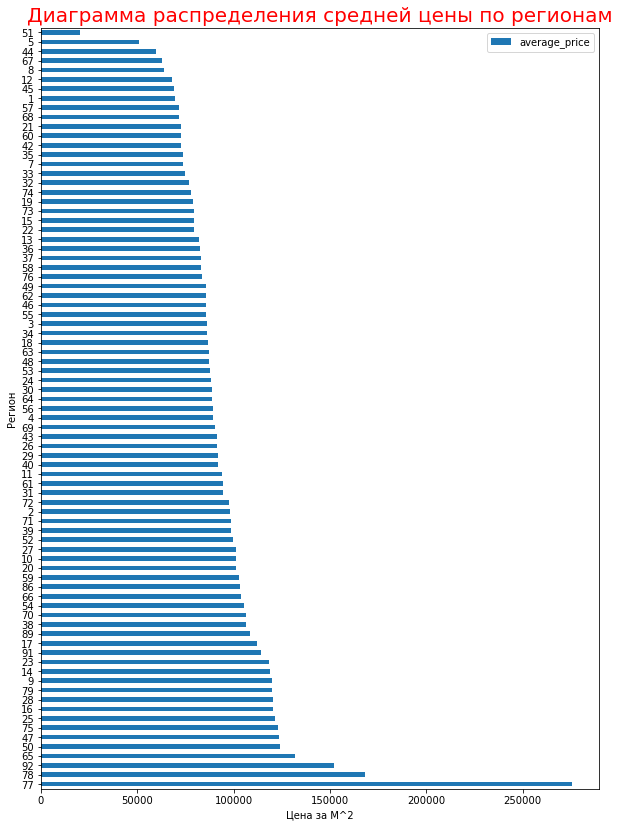

In [184]:
from pylab import rcParams
rcParams['figure.figsize'] = 10,14
region_mean.plot(kind='barh')
plt.xlabel("Цена за М^2")
plt.title('Диаграмма распределения средней цены по регионам', size=20, color='r')    

Проанализируем полученную гистограмму. Видно, что самые высокие средние цены за квадратный метр приходятся на жилую недвижимость строющуюся в г. Москве. На втором месте идет г. Санкт-Петербург. Самые низкие цены приходятся на 51 регион, что соответствует Мурманской области.

In [212]:
#Рассчитать объемы вводимого жилья по регионам и по годам

In [ ]:
#для удобства расчетов дату ввода преобразуем в год и добавим в DF новый столбец year_upd

In [202]:
modif_df['year_upd'] = modif_df['Дата_ввода'].dt.year

In [204]:
modif_df

,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,Средняя_цена_м,year_upd
id,,,,,,,,,,,,,
13391,2МЕН ГРУПП,Тюменская область,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,55893.0,2022
13383,2МЕН ГРУПП,Тюменская область,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,53109.0,2022
13398,2МЕН ГРУПП,Тюменская область,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,47886.0,2024
13397,2МЕН ГРУПП,Тюменская область,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,45523.0,2024
13399,2МЕН ГРУПП,Тюменская область,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,50768.0,2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...
28071,ЯРКИЙ МИР,Московская область,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,85604.0,2024
28070,ЯРКИЙ МИР,Московская область,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,85309.0,2025
28073,ЯРКИЙ МИР,Московская область,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,85634.0,2024


In [213]:
#сгруппируем данные по региону и году ввода жилья, посчитав сумму и количестово строящихся квартир и объектов.
region_year = (modif_df.groupby(['Город', 'year_upd']).agg(vsego_kvar =('Кол-во_квартир', 'sum'), vsego_obj=('Кол-во_квартир', 'count')))

In [214]:
region_year

vsego_kvar  vsego_obj
Город               year_upd                       
Адыгея Республика   2022             200          2
                    2023            1074         12
                    2024            1690         14
                    2025             790          6
                    2026             272          1
...                                  ...        ...
Ярославская область 2026             265          1
г.Москва            2022               0          1
                    2024            3953          4
                    2025            1459          1
г.Санкт-Петербург   2024             312          2

[454 rows x 2 columns]

Text(113.96875, 0.5, 'Регион(город)')

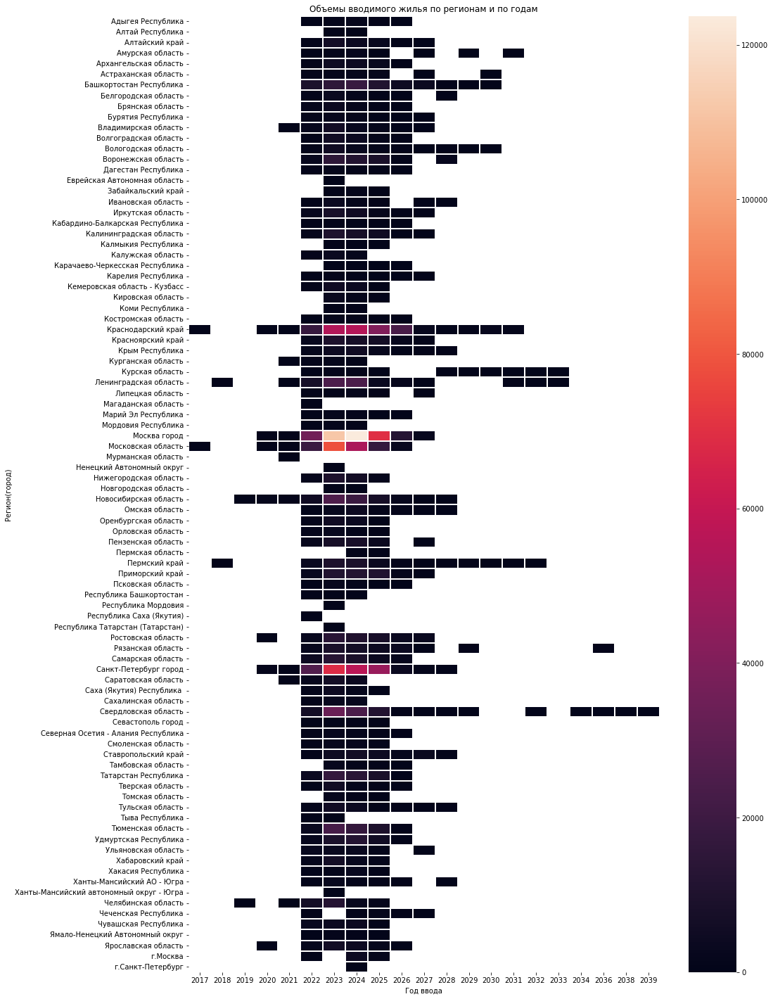

In [219]:
#посторим тепловую карту для лучшей наглядности полученной информации
plt.figure(figsize=(15, 25))
plt.title("Объемы вводимого жилья по регионам и по годам")
sns.heatmap(region_year.reset_index().pivot("Город", "year_upd", "vsego_kvar"),linewidths=0.3)
plt.xlabel("Год ввода")
plt.ylabel("Регион(город)")

Проанализируем полученную тепловую карту:
Самое большое количество сданных квартир будет в Москве в 2024 году. В 2023 году всех больше будут сданы квартиры в Московской области и Санкт-Петербурге.
Всех меньше строится квартир в Еврейской автономной области, Магаданской, Мурманской, Ненецкого автономного округа, республики Мордовия, Саха, Республика Татарстан(что странно),Ханты-Мансийский огруг.
Республика Татарстан, как и г.Москва, г.Санкт-Петербург также присутствуют на карте. Так как в DF регионы были названы по разному(г.Москва и Москва город) поэтому на тепловой карте они попали в разные категории, как и города(регионы выше).\
Перспективы ввода жилья по различным областям и городам радуют, так как ввод новых домов идет каждый год и в большинстве случаев до 2028 года.
Также можно заметить, что Свердловская область имеет срок сдачи аж 2039г. Похоже на выброс.Необходимо анализировать данные.

In [42]:
#Сравнить этажность домов, количество квартир, жилую площадь, количество парковочных мест и цену за квадратный метр
#в разных регионах

In [221]:
data_region = (modif_df.groupby('Город')
    .agg(kol_eta=('Кол-во_этажей', 'mean'), kol_kvar=('Кол-во_квартир', 'mean'), area=('Жилая_площадь', 'mean'), 
        count_parking=('Мест_в_паркинге', 'mean'), mean_price_m=('Средняя_цена_м', 'mean')))

In [223]:
data_region.sort_values('mean_price_m', ascending = False)

,kol_eta,kol_kvar,area,count_parking,mean_price_m
Город,,,,,
г.Москва,23.333333,902.000000,45483.133333,269.833333,245570.166667
Москва город,18.200909,325.000909,17211.759491,106.443636,242585.136618
г.Санкт-Петербург,9.500000,156.000000,9429.130000,101.000000,214589.285000
Республика Татарстан (Татарстан),20.000000,108.000000,5931.910000,0.000000,159356.500000
Санкт-Петербург город,11.946176,289.882436,12340.043272,60.406516,156264.224972
...,...,...,...,...,...
Калмыкия Республика,7.500000,66.666667,4064.847500,0.000000,66040.345000
Костромская область,5.561404,56.561404,3113.094211,0.000000,64433.688947
Алтай Республика,11.166667,83.166667,4218.657500,5.666667,64115.083333


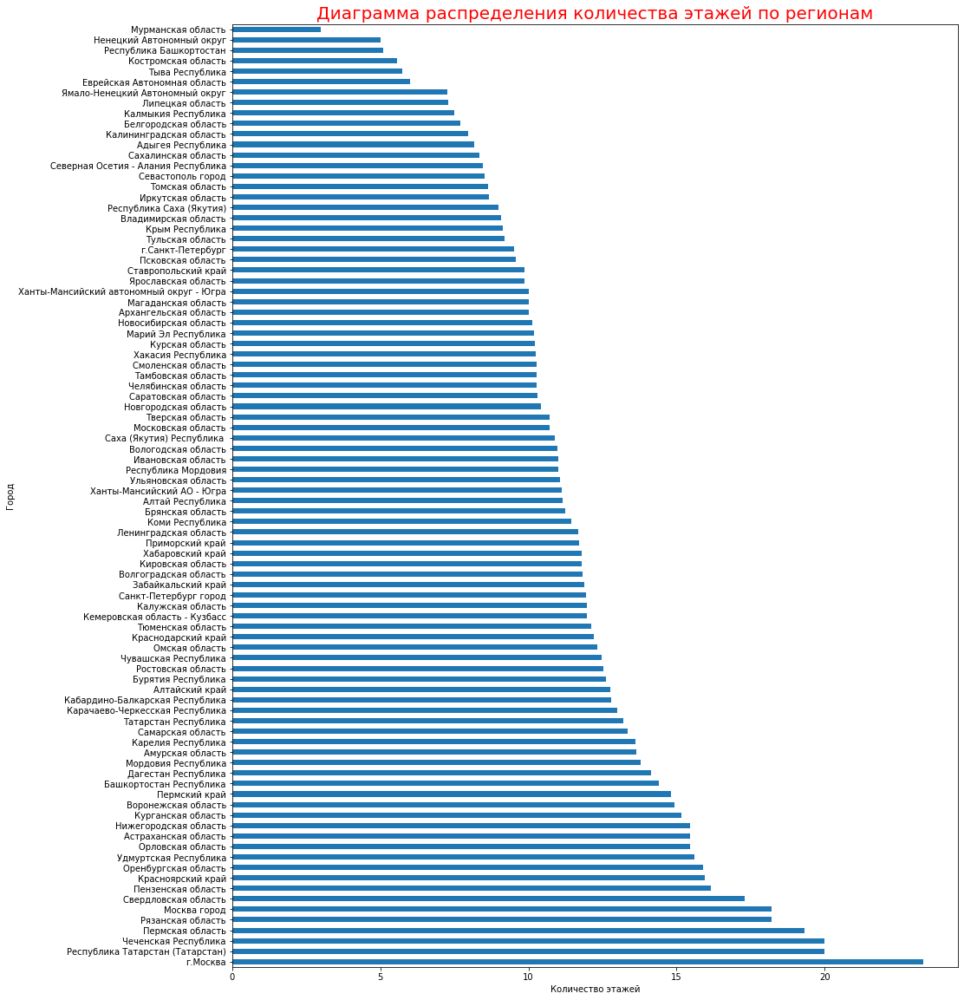

In [230]:
rcParams['figure.figsize'] = 15,20
data_region['kol_eta'].sort_values(ascending=False).plot(kind='barh')
plt.xlabel("Количество этажей")
plt.title('Диаграмма распределения количества этажей по регионам', size=20, color='r')    
plt.show()

Проанализируем диаграмму: видно, что самые высокие дома строятся в г. Москва( выше 20 этажей), за ней следуют Ркспублика Татарстан и Чеченская республика(в среднем 20 этажей). Самые невысокие дома находятся Мурманской области(менее 5 этажей).

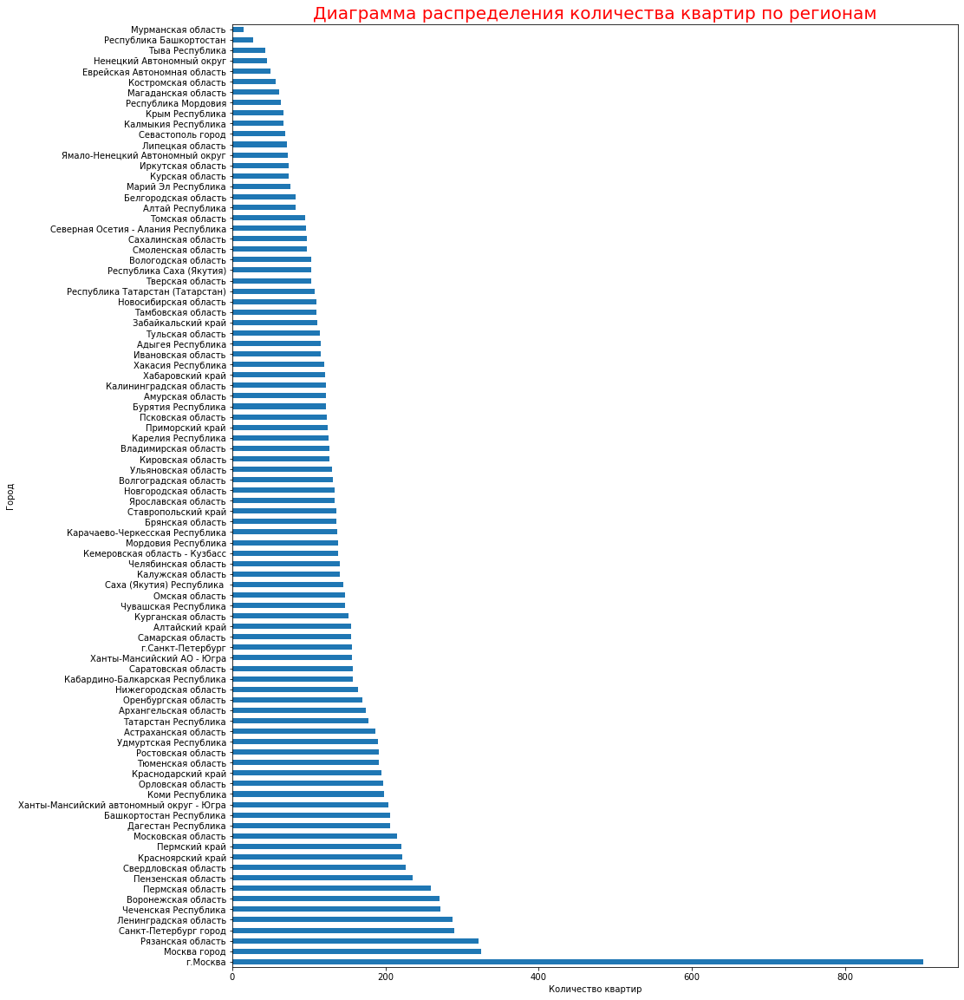

In [232]:
rcParams['figure.figsize'] = 15,20
data_region['kol_kvar'].sort_values(ascending=False).plot(kind='barh')
plt.xlabel("Количество квартир")
plt.title('Диаграмма распределения количества квартир по регионам', size=20, color='r')    
plt.show()

Проанализируем диаграмму: тут почти все тоже самое как и в диаграмме распределения количества этажей по регионам. Самые многоквартирные дома сторятся в Москве, самые малоквартирные - в Мурманской области.

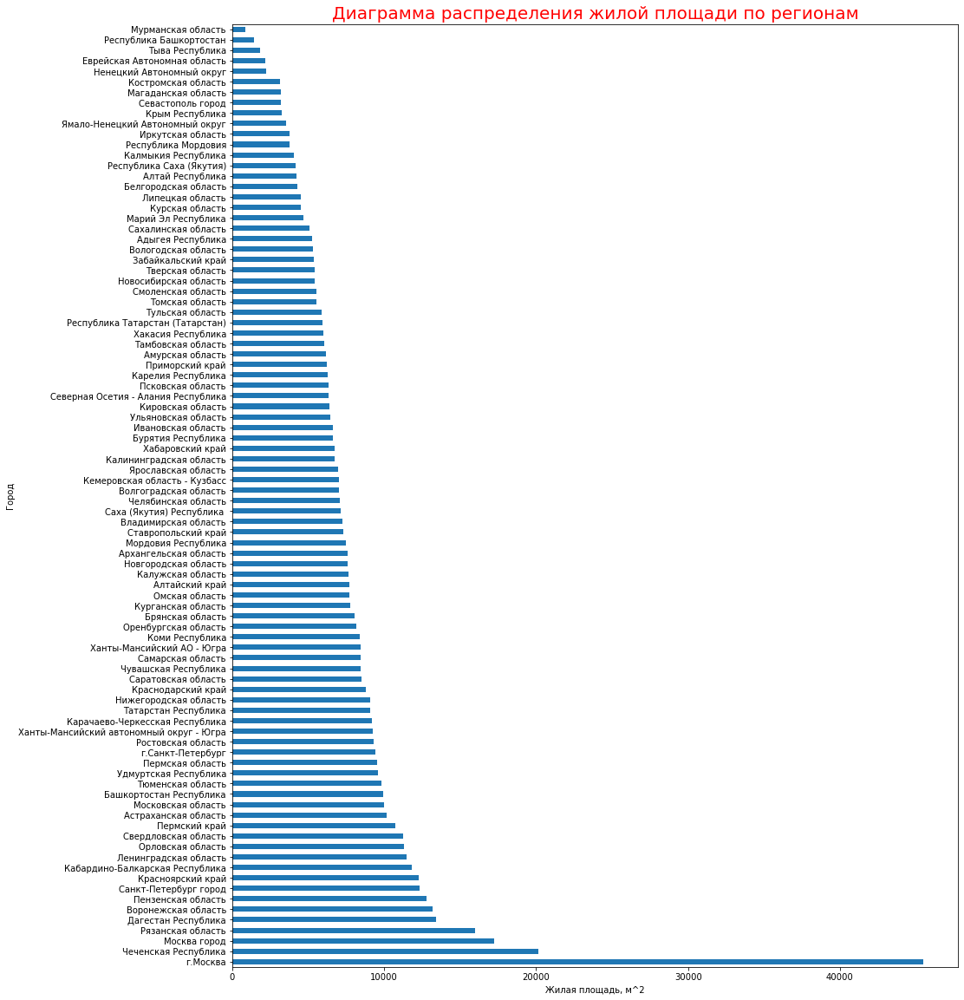

In [234]:
rcParams['figure.figsize'] = 15,20
data_region['area'].sort_values(ascending=False).plot(kind='barh')
plt.xlabel("Жилая площадь, м^2")
plt.title('Диаграмма распределения жилой площади по регионам', size=20, color='r')    
plt.show()

По средней площади жилых помещений лидером является г.Москва, на втором месте Чеченская республика. Мурманская область на последнем месте.

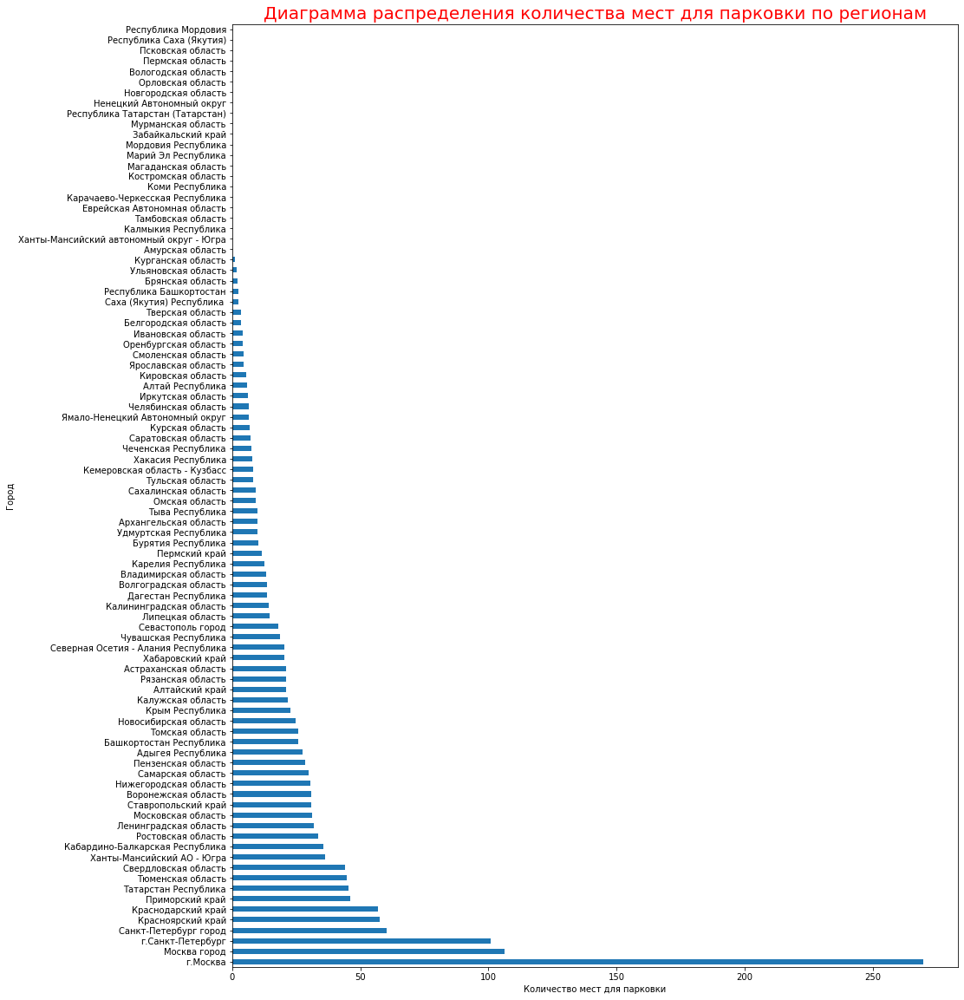

In [235]:
rcParams['figure.figsize'] = 15,20
data_region['count_parking'].sort_values(ascending=False).plot(kind='barh')
plt.xlabel("Количество мест для парковки")
plt.title('Диаграмма распределения количества мест для парковки по регионам', size=20, color='r')    
plt.show()

Проанализируем диаграмму: как и ожидалось, самое большое количество мест для парковки, находится в Москве. После нее идет Санкт - Петербург. В некоторых областях совсем нет мест для парковки в строящихся домах.

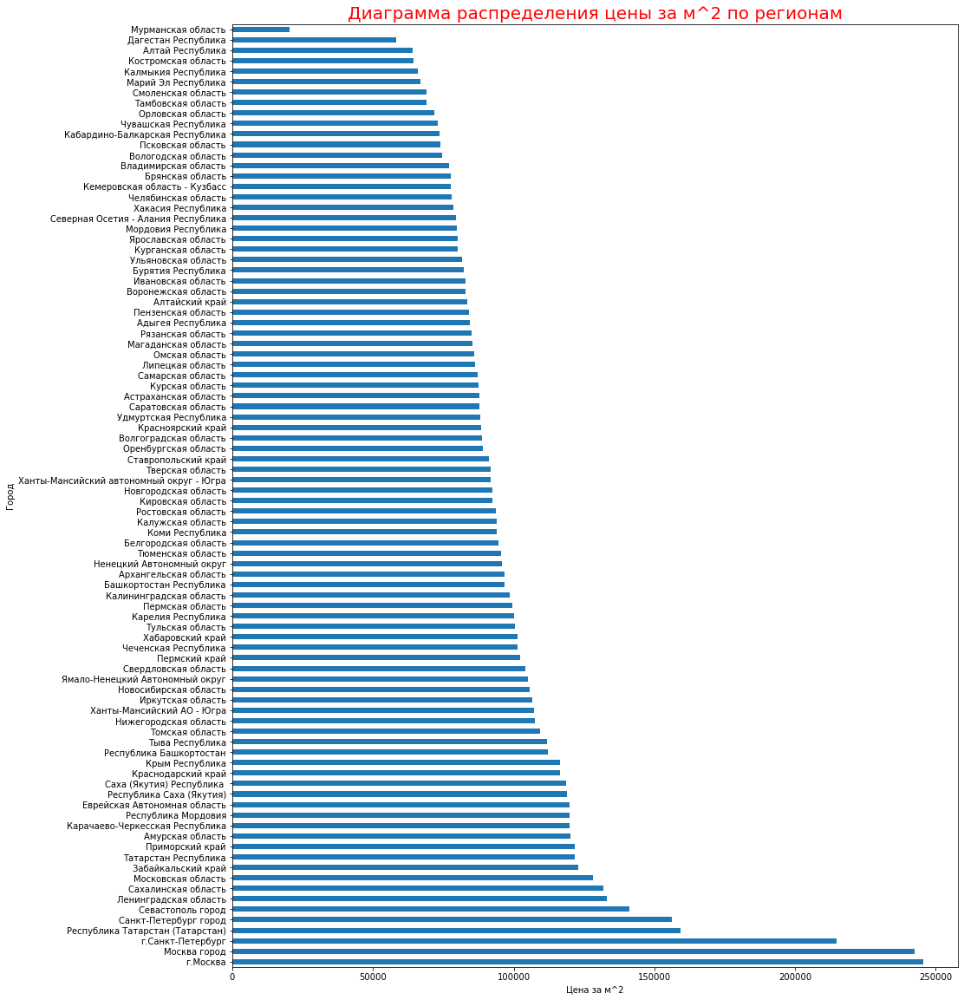

In [237]:
rcParams['figure.figsize'] = 15,20
data_region['mean_price_m'].sort_values(ascending=False).plot(kind='barh')
plt.xlabel("Цена за м^2")
plt.title('Диаграмма распределения цены за м^2 по регионам', size=20, color='r')    
plt.show()

И опять, самые дорогие квартиры находятся в Москве. Средняя стоимость за квадратный метр более 200 т.р. На втором месте Санкт-Петербург. Самые дежевые квартиры в Мурманской области - менее 50 т.р.

In [ ]:
#Визуализировать разброс, связь и распределение этих показателей по регионам

In [265]:
data = modif_df.reset_index()

In [266]:
data

,id,Имя_застройщика,Город,Регион,Кол-во_этажей,Кол-во_квартир,Дата_ввода,Тип_отделки,Free_планировка,Мест_в_паркинге,Жилая_площадь,Класс_недвижимости,Средняя_цена_м,year_upd
0,13391,2МЕН ГРУПП,Тюменская область,72,12,44,2022-12-31,По желанию заказчика,Есть,41,4297.44,Элитный,55893.0,2022
1,13383,2МЕН ГРУПП,Тюменская область,72,20,68,2022-12-31,По желанию заказчика,Есть,31,6296.55,Элитный,53109.0,2022
2,13398,2МЕН ГРУПП,Тюменская область,72,10,43,2024-12-31,Без отделки,Нет,0,4812.98,Элитный,47886.0,2024
3,13397,2МЕН ГРУПП,Тюменская область,72,12,65,2024-12-31,Без отделки,Нет,0,6248.51,Элитный,45523.0,2024
4,13399,2МЕН ГРУПП,Тюменская область,72,1,0,2024-12-31,Без отделки,Нет,125,0.00,Элитный,50768.0,2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10762,28071,ЯРКИЙ МИР,Московская область,50,26,288,2024-06-30,Под ключ,Нет,0,14870.40,Типовой,85604.0,2024
10763,28070,ЯРКИЙ МИР,Московская область,50,26,768,2025-03-31,Под ключ,Нет,0,29620.10,Типовой,85309.0,2025
10764,28073,ЯРКИЙ МИР,Московская область,50,26,312,2024-06-30,Под ключ,Нет,0,14872.80,Типовой,85634.0,2024
10765,44447,СПЕЦИАЛИЗИРОВАННЫЙ ЗАСТРОЙЩИК ЯРОСЛАВЛЬЗАКАЗЧИК,Ярославская область,76,6,127,2022-12-31,Другое,Нет,0,6764.22,Типовой,70681.0,2022


In [295]:
import plotly.express as px

In [297]:
#построим разброс значений по каждому региону и средней цены за м
df = data
fig = px.box(df, x="Город", y="Средняя_цена_м")
fig.show()

Проанализируем полученную информацию: на графике разбросов видно, что всех больше выбросов в Москве. Медианное значение составляет 198 т.р за м^2, а максимальный выброс - 2.2 млн.р. Похожая ситуация, но цены намного ниже это в Краснодарском крае. Там медианное значение цены составляет -120 т.р., максимальная же цена - 1.56 млн.р

In [298]:
df = data
fig = px.box(df, x="Город", y="Кол-во_этажей")
fig.show()

Проанализируем полученную информацию: на графике разбросов видно, что по этажности имеются большие выбросы в г.Москве - 76 этажей.Также Москва является лидером по этажности в домах - более 21 этажа.

In [305]:
df = data
fig = px.box(df, x="Город", y="Кол-во_квартир")
fig.show()

По количесву квартир также лидирует Москва(755 квартир в среднем в доме).Также в Москве, Санкт-Петербурге имеются большие выбросы(2522 и 2676 квартир).Всех меньше квартир в Еврейской автономной области, Якутия,Магаданская область(связано с Дальним Востоком)

In [303]:
df = data
fig = px.box(df, x="Город", y="Жилая_площадь")
fig.show()

По площади опять лидирует Москва.(41,5 т.м^2).

In [301]:
df = data
fig = px.box(df, x="Город", y="Мест_в_паркинге")
fig.show()

Проанализируем полученый результат. Почти у  всех регионов медианное значение = 0, то есть 50% строящихся домов строится без парковочных мест. В Москве больше всего мест в среднем -205 шт. В Краснодарском крае имеются большие выбросы, в одном из комплексов имеется 3580 мест.